# Project 6: Face Covering Detection (FCD) using 3 Neural Network models

## Project Overview
This project implements a Computer Vision pipeline for Face Covering Detection. It analyzes images to classify whether a person is:
- Class 0: No mask
- Class 1: Mask worn correctly
- Class 2: Mask worn improperly

## Methodology
I implement three different machine learning approaches:
1. HOG + SVM: Using Histogram of Oriented Gradients with Support Vector Machine classifier
2. SIFT + MLP: Using Scale-Invariant Feature Transform with Multi-Layer Perceptron
3. CNN: Convolutional Neural Network with Transfer Learning (MobileNetV2)

## Requirements
- Python 3.x
- Libraries: OpenCV, scikit-learn, scikit-image, TensorFlow, numpy, pandas, matplotlib

## Dataset
The dataset consists of 2394 training and 458 testing facial images labeled according to mask usage.

Author: Nixon Ng

Date: April 2025

In [1]:
# Mount to Google Drive (If using)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Data Preprocessing & Exploration

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from sklearn.model_selection import train_test_split
from glob import glob

# Define project paths
base_dir = './INM460-Computer-Vision/cv-ind-project/CW_Folder_PG'
data_dir = './INM460-Computer-Vision/cv-ind-project/CW_Folder_PG/CW_Dataset/CV2024_CW_Dataset'

# Function to load the dataset
def load_dataset(data_dir, target_size=(224, 224)):
    """
    Load and preprocess the mask detection dataset.
    
    Parameters:
    -----------
    data_dir : str
        Directory path containing the dataset
    target_size : tuple, default=(224, 224)
        Target size for image resizing
        
    Returns:
    --------
    tuple
        (images, labels) where:
        - images: numpy array of shape (n_samples, height, width, channels)
        - labels: numpy array of shape (n_samples,) with values 0 (no mask), 
                 1 (mask), or 2 (improper mask)
    """
    images = []
    labels = []
    
    # For training data
    image_paths = glob(os.path.join(data_dir, 'train', 'images', '*.jpeg'))
    print(f"Found {len(image_paths)} images")
    
    for img_path in image_paths:
        # Extract image ID and read corresponding label
        img_id = os.path.basename(img_path).split('.')[0]
        label_path = os.path.join(data_dir, 'train', 'labels', f'{img_id}.txt')
        
        try:
            # Read label from text file
            with open(label_path, 'r') as f:
                label = int(f.read().strip())
            
            # Read and preprocess image
            img = cv2.imread(img_path)
            if img is None:
                print(f"Failed to load image: {img_path}")
                continue
            
            # Convert from BGR to RGB (OpenCV loads as BGR)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            # Resize to consistent dimensions for model input
            img = cv2.resize(img, target_size)
            
            images.append(img)
            labels.append(label)
            
        except Exception as e:
            print(f"Error processing {img_path}: {str(e)}")
            continue
    
    if not images:
        raise ValueError("No images were successfully loaded!")
        
    return np.array(images), np.array(labels)

# Load dataset
X, y = load_dataset(data_dir)

# Analyze class distribution
unique, counts = np.unique(y, return_counts=True)
print("Class distribution:", dict(zip(unique, counts)))

# Split into train and validation (80/20 split with stratification to maintain class distribution)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

def preprocess_image(image, target_size=(128, 128)):
    """
    Preprocess a single image for model input.
    
    Parameters:
    -----------
    image : numpy.ndarray
        Input image
    target_size : tuple, default=(128, 128)
        Target size for resizing
        
    Returns:
    --------
    numpy.ndarray
        Preprocessed image
    """
    # Resize to consistent dimensions
    resized = cv2.resize(image, target_size)
    # Normalize pixel values to [0, 1] range
    normalized = resized / 255.0
    return normalized

# Applying preprocessing
X_train_processed = np.array([preprocess_image(img) for img in X_train])
X_val_processed = np.array([preprocess_image(img) for img in X_val])

def load_test_data(data_dir):
    """
    Load and preprocess the test dataset.
    
    Parameters:
    -----------
    data_dir : str
        Directory path containing the dataset
        
    Returns:
    --------
    tuple
        (images, labels) for the test set
    """
    images = []
    labels = []
    
    # Look for .jpeg extension
    image_paths = glob(os.path.join(data_dir, 'test', 'images', '*.jpeg'))
    print(f"Found {len(image_paths)} test images")
    
    for img_path in image_paths:
        img_id = os.path.basename(img_path).split('.')[0]
        label_path = os.path.join(data_dir, 'test', 'labels', f'{img_id}.txt')
        
        try:
            with open(label_path, 'r') as f:
                label = int(f.read().strip())
            
            # Read and preprocess image
            img = cv2.imread(img_path)
            if img is None:
                print(f"Failed to load image: {img_path}")
                continue
                
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (224, 224))  # Resize to consistent dimensions
            
            images.append(img)
            labels.append(label)
            
        except Exception as e:
            print(f"Error processing {img_path}: {str(e)}")
            continue
    
    if not images:
        raise ValueError("No images were successfully loaded!")
        
    return np.array(images), np.array(labels)

# Load test data
X_test, y_test = load_test_data(data_dir)
X_test_processed = np.array([preprocess_image(img) for img in X_test])

Found 2394 images
Class distribution: {0: 376, 1: 1940, 2: 78}
Found 458 test images


## 2. Model Implementation
### 2.1 HOG + SVM Model

In [9]:
"""
In this section, we implement a model using Histogram of Oriented Gradients (HOG)
features with a Support Vector Machine (SVM) classifier.

HOG is a feature descriptor that counts occurrences of gradient orientation in
localized portions of an image, making it useful for capturing edge and gradient
structure that is characteristic of local shape.
"""

from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV
from skimage.feature import hog

def extract_hog_features(images):
    """
    Extract Histogram of Oriented Gradients (HOG) features from images.
    
    Parameters:
    -----------
    images : numpy.ndarray
        Array of images
        
    Returns:
    --------
    numpy.ndarray
        Array of HOG features
    """
    hog_features = []
    for image in images:
        # Convert float64 back to uint8 if needed
        if image.dtype == np.float64:
            image = (image * 255).astype(np.uint8)
            
        # Convert to grayscale (HOG works on grayscale images)
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        else:
            gray = image
            
        # Extract HOG features with the following parameters:
        # - 9 orientation bins (directions)
        # - 8x8 pixels per cell
        # - 2x2 cells per block for normalization
        features = hog(gray, orientations=9, 
                      pixels_per_cell=(8, 8),
                      cells_per_block=(2, 2),
                      transform_sqrt=True,  # Apply power law compression
                      block_norm='L2-Hys')  # L2-norm with clipping
        
        hog_features.append(features)
    
    return np.array(hog_features)

# Extract HOG features for training, validation, and test sets
X_train_hog = extract_hog_features(X_train_processed)
X_val_hog = extract_hog_features(X_val_processed)
X_test_hog = extract_hog_features(X_test_processed)

# Define parameter grid for hyperparameter tuning
param_grid = {
    'C': [0.1, 1, 10, 100],  # Regularization parameter
    'gamma': ['scale', 'auto'],  # Kernel coefficient
    'kernel': ['rbf', 'linear']  # Kernel type
}

# Initialize SVM classifier
svm = SVC(probability=True)

# Perform grid search with cross-validation to find optimal parameters
grid_search = GridSearchCV(svm, param_grid, cv=3, scoring='accuracy', verbose=1)
grid_search.fit(X_train_hog, y_train)

# Get best model
best_svm = grid_search.best_estimator_
print("Best parameters:", grid_search.best_params_)

# Evaluate on validation set
y_val_pred = best_svm.predict(X_val_hog)
print("Validation accuracy:", accuracy_score(y_val, y_val_pred))
print(classification_report(y_val, y_val_pred))

# Save the model for later use
import joblib
joblib.dump(best_svm, f'{base_dir}/Models/svm_model.joblib')

Best parameters: {'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}
Validation accuracy: 0.8496868475991649
              precision    recall  f1-score   support

           0       0.60      0.53      0.56        75
           1       0.89      0.94      0.92       388
           2       1.00      0.06      0.12        16

    accuracy                           0.85       479
   macro avg       0.83      0.51      0.53       479
weighted avg       0.85      0.85      0.83       479



### 2.2 SIFT + Multilayer Perceptron Model

In [11]:
"""
This section implements a model using Scale-Invariant Feature Transform (SIFT)
features combined with a Multilayer Perceptron (MLP) neural network.

SIFT features are robust to changes in image scale, rotation, and illumination,
making them suitable for object recognition tasks. We convert SIFT features to
a Bag of Visual Words representation for classification.
"""

from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import KMeans
from sklearn.metrics import (accuracy_score, precision_score, recall_score, 
                           f1_score, confusion_matrix, classification_report)
from collections import Counter
import time

def extract_sift_features(images, n_clusters=100):
    """
    Extract SIFT features and create Bag of Visual Words representation.
    
    Parameters:
    -----------
    images : numpy.ndarray
        Array of images
    n_clusters : int, default=100
        Number of visual word clusters (k in k-means)
        
    Returns:
    --------
    tuple
        (features, kmeans_model)
    """
    # Initialize SIFT detector
    sift = cv2.SIFT_create()
    
    # Extract SIFT descriptors from all images
    all_descriptors = []
    for image in images:
        # Convert float64 back to uint8 if needed
        if image.dtype == np.float64:
            image = (image * 255).astype(np.uint8)
            
        # Convert to grayscale if necessary
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        else:
            gray = image
        
        # Detect keypoints and extract descriptors
        keypoints, descriptors = sift.detectAndCompute(gray, None)
        
        if descriptors is not None:
            all_descriptors.append(descriptors)
    
    # Concatenate all descriptors for clustering
    all_descriptors = np.vstack(all_descriptors)
    
    # Create visual vocabulary using K-means clustering
    print("Training K-means for BoVW...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(all_descriptors)

    # Function to create histograms of visual words
    def create_histogram(image):
        # Convert float64 back to uint8 if needed
        if image.dtype == np.float64:
            image = (image * 255).astype(np.uint8)
            
        # Convert to grayscale if necessary
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        else:
            gray = image
        
        # Extract SIFT features
        keypoints, descriptors = sift.detectAndCompute(gray, None)
        
        # Create histogram of visual words
        histogram = np.zeros(n_clusters)
        
        if descriptors is not None:
            # Assign each descriptor to a cluster (visual word)
            visual_words = kmeans.predict(descriptors)
            
            # Count frequency of each visual word
            counts = Counter(visual_words)
            
            # Create histogram
            for word, count in counts.items():
                histogram[word] = count
                
        # Normalize histogram to sum to 1
        if np.sum(histogram) > 0:
            histogram = histogram / np.sum(histogram)
            
        return histogram

    # Create histograms for all images
    features = np.array([create_histogram(img) for img in images])
    
    return features, kmeans

# Extract SIFT features and train K-means for Bag of Visual Words
print("Extracting SIFT features for training data...")
X_train_sift, kmeans = extract_sift_features(X_train_processed)

def create_bow_features(images, kmeans, n_clusters=100):
    """
    Create Bag of Words features using a pre-trained k-means model.
    
    Parameters:
    -----------
    images : numpy.ndarray
        Array of images
    kmeans : sklearn.cluster.KMeans
        Trained k-means model
    n_clusters : int, default=100
        Number of visual word clusters
        
    Returns:
    --------
    numpy.ndarray
        Bag of Words feature vectors
    """
    sift = cv2.SIFT_create()
    
    bow_features = []
    for image in images:
        # Convert float64 back to uint8 if needed
        if image.dtype == np.float64:
            image = (image * 255).astype(np.uint8)
            
        # Convert to grayscale if necessary
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        else:
            gray = image
        
        # Extract SIFT features
        keypoints, descriptors = sift.detectAndCompute(gray, None)
        
        # Create histogram
        histogram = np.zeros(n_clusters)
        
        if descriptors is not None:
            # Assign each descriptor to a cluster (visual word)
            visual_words = kmeans.predict(descriptors)
            
            # Count frequency of each visual word
            counts = Counter(visual_words)
            
            # Create histogram
            for word, count in counts.items():
                histogram[word] = count
                
        # Normalize histogram
        if np.sum(histogram) > 0:
            histogram = histogram / np.sum(histogram)
            
        bow_features.append(histogram)
    
    return np.array(bow_features)

# Create Bag of Words features for validation and test sets
print("Creating BoW features for validation data...")
X_val_sift = create_bow_features(X_val_processed, kmeans)
print("Creating BoW features for test data...")
X_test_sift = create_bow_features(X_test_processed, kmeans)

# Setup MLP classifier with preprocessing pipeline
print("Setting up MLP classifier pipeline...")
mlp_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Neural networks perform better with scaled inputs
    ('mlp', MLPClassifier(random_state=42, max_iter=1000))
])

# Define parameter grid for hyperparameter tuning
param_grid = {
    'mlp__hidden_layer_sizes': [(100,), (100, 50), (100, 100)],  # Network architecture
    'mlp__activation': ['relu', 'tanh'],  # Activation function
    'mlp__alpha': [0.0001, 0.001, 0.01],  # L2 regularization parameter
    'mlp__learning_rate': ['constant', 'adaptive']  # Learning rate schedule
}

# Use GridSearchCV for hyperparameter optimization
print("Starting GridSearchCV for MLP hyperparameter tuning...")
start_time = time.time()
grid_search = GridSearchCV(mlp_pipeline, param_grid, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train_sift, y_train)
end_time = time.time()

print(f"GridSearchCV completed in {end_time - start_time:.2f} seconds")
print(f"Best parameters: {grid_search.best_params_}")

# Get the best MLP model
best_mlp = grid_search.best_estimator_

# Evaluate on validation set
print("Evaluating MLP on validation set...")
y_val_pred_mlp = best_mlp.predict(X_val_sift)
print("Validation accuracy (MLP):", accuracy_score(y_val, y_val_pred_mlp))
print(classification_report(y_val, y_val_pred_mlp))

# Save the model and kmeans
print("Saving the MLP model and kmeans model...")
joblib.dump(best_mlp, f'{base_dir}/Models/mlp_model.joblib')
joblib.dump(kmeans, f'{base_dir}/Models/kmeans_bovw_mlp.joblib')

# Evaluate on test set
print("Evaluating MLP on test set...")
y_test_pred_mlp = best_mlp.predict(X_test_sift) 
print("Test accuracy (MLP):", accuracy_score(y_test, y_test_pred_mlp))
print(classification_report(y_test, y_test_pred_mlp))

# Record model performance metrics for later comparison
mlp_results = {
    'Model': 'SIFT+MLP',
    'Accuracy': accuracy_score(y_test, y_test_pred_mlp),
    'Precision': precision_score(y_test, y_test_pred_mlp, average='weighted', zero_division=0),
    'Recall': recall_score(y_test, y_test_pred_mlp, average='weighted', zero_division=0),
    'F1-Score': f1_score(y_test, y_test_pred_mlp, average='weighted', zero_division=0),
    'Confusion Matrix': confusion_matrix(y_test, y_test_pred_mlp),
    'Classification Report': classification_report(y_test, y_test_pred_mlp, output_dict=True, zero_division=0),
    'Predictions': y_test_pred_mlp
}

### 2.3 CNN Model with Transfer Learning

In [10]:
"""
This section implements a Convolutional Neural Network (CNN) model for face 
covering detection using transfer learning with the MobileNetV2 architecture.

Transfer learning allows us to leverage a pre-trained model (trained on ImageNet)
and adapt it to our specific task, which is particularly useful when working with
limited training data.
"""

import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Setup data augmentation to improve model generalization
datagen = ImageDataGenerator(
    rotation_range=20,  # Random rotation in the range [-20, 20] degrees
    width_shift_range=0.2,  # Random horizontal shift
    height_shift_range=0.2,  # Random vertical shift
    shear_range=0.2,  # Random shear transformations
    zoom_range=0.2,  # Random zoom
    horizontal_flip=True,  # Random horizontal flips
    fill_mode='nearest'  # Strategy for filling in newly created pixels
)

# Prepare data for CNN (resize to 224x224 for MobileNetV2 input requirements)
X_train_cnn = np.array([cv2.resize(img, (224, 224)) for img in X_train])
X_val_cnn = np.array([cv2.resize(img, (224, 224)) for img in X_val])
X_test_cnn = np.array([cv2.resize(img, (224, 224)) for img in X_test])

# Normalize data to [0, 1] range
X_train_cnn = X_train_cnn / 255.0
X_val_cnn = X_val_cnn / 255.0
X_test_cnn = X_test_cnn / 255.0

# Convert labels to categorical format (one-hot encoding)
y_train_cat = tf.keras.utils.to_categorical(y_train, 3)
y_val_cat = tf.keras.utils.to_categorical(y_val, 3)
y_test_cat = tf.keras.utils.to_categorical(y_test, 3)

# Build the model with transfer learning
# Load MobileNetV2 pre-trained on ImageNet without the classification layers
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze base model layers to prevent them from being updated during initial training
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification layers on top of the base model
x = base_model.output
# Global average pooling reduces each feature map to a single value
x = GlobalAveragePooling2D()(x)
# Dense layer with ReLU activation
x = Dense(128, activation='relu')(x)
# Dropout for regularization to prevent overfitting
x = Dropout(0.5)(x)
# Output layer with softmax activation for multi-class classification
predictions = Dense(3, activation='softmax')(x)

# Create the model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model with Adam optimizer
model.compile(optimizer=Adam(learning_rate=0.001), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

# Setup callbacks for training
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitor validation loss
    patience=5,  # Stop if no improvement for 5 epochs
    restore_best_weights=True  # Restore the best model weights
)
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Monitor validation loss
    factor=0.2,  # Reduce learning rate by factor of 0.2
    patience=3,  # Wait for 3 epochs before reducing LR
    min_lr=0.00001  # Minimum learning rate
)

# Train the model with frozen base layers
history = model.fit(
    datagen.flow(X_train_cnn, y_train_cat, batch_size=32),  # Use data augmentation
    steps_per_epoch=len(X_train_cnn) // 32,
    epochs=15,
    validation_data=(X_val_cnn, y_val_cat),
    callbacks=[early_stopping, reduce_lr]
)

# Fine-tuning: Unfreeze some layers and train with lower learning rate
# This allows us to fine-tune the pre-trained features to our specific task
for layer in base_model.layers[-20:]:
    layer.trainable = True

# Recompile the model with a lower learning rate for fine-tuning
model.compile(optimizer=Adam(learning_rate=0.0001), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

# Train fine-tuned model
history_fine_tune = model.fit(
    datagen.flow(X_train_cnn, y_train_cat, batch_size=32),
    steps_per_epoch=len(X_train_cnn) // 32,
    epochs=10,
    validation_data=(X_val_cnn, y_val_cat),
    callbacks=[early_stopping, reduce_lr]
)

# Evaluate on test set
# Convert test data to float32 to ensure compatibility with TensorFlow
X_test_cnn = X_test_cnn.astype('float32')
y_test_cat = y_test_cat.astype('float32')

# Evaluate on test set
test_loss, test_acc = model.evaluate(X_test_cnn, y_test_cat, verbose=1)
print(f"Test accuracy: {test_acc:.4f}")

# Save the model
model.save(f'{base_dir}/Models/cnn_model.h5')

15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 167ms/step - accuracy: 0.8675 - loss: 0.5385


Test accuracy: 0.8865


## 3. Model Comparison and Evaluation

In [ ]:
"""
This section compares the three implemented models (HOG+SVM, SIFT+MLP, and CNN)
on the test dataset to determine which performs best for face covering detection.

We evaluate models based on:
1. Accuracy, precision, recall, and F1-score
2. Inference time (speed)
3. Model size
4. Confusion matrices
"""

# Verify original data shapes
print("Original X_test shape:", X_test.shape)
print("Original y_test shape:", y_test.shape)

# Extract HOG features for test data
X_test_hog = extract_hog_features(X_test_processed)
print("X_test_hog shape:", X_test_hog.shape)

# Extract SIFT features for test data
X_test_sift = create_bow_features(X_test_processed, kmeans)
print("X_test_sift shape:", X_test_sift.shape)

# Prepare CNN test data
X_test_cnn = np.array([cv2.resize(img, (224, 224)) for img in X_test])
X_test_cnn = X_test_cnn / 255.0  # Normalize
X_test_cnn = X_test_cnn.astype(np.float32)
print("X_test_cnn shape:", X_test_cnn.shape)

Original X_test shape: (458, 224, 224, 3)
Original y_test shape: (458,)
X_test_hog shape: (458, 8100)
X_test_sift shape: (458, 100)
X_test_cnn shape: (458, 224, 224, 3)



Class distribution in predictions for HOG+SVM:
Predicted classes: (array([0, 1, 2]), array([ 48, 402,   8], dtype=int64))
Actual classes: (array([0, 1, 2]), array([ 51, 388,  19], dtype=int64))

Class distribution in predictions for SIFT+MLP:
Predicted classes: (array([0, 1, 2]), array([ 43, 414,   1], dtype=int64))
Actual classes: (array([0, 1, 2]), array([ 51, 388,  19], dtype=int64))
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step

Class distribution in predictions for CNN:
Predicted classes: (array([0, 1], dtype=int64), array([ 49, 409], dtype=int64))
Actual classes: (array([0, 1, 2]), array([ 51, 388,  19], dtype=int64))

Model Comparison:
      Model  Accuracy  Precision    Recall  F1-Score  Inference Time (ms)  \
0   HOG+SVM  0.864629   0.855434  0.864629  0.856674             4.179497   
1  SIFT+MLP  0.851528   0.809461  0.851528  0.829311             0.012119   
2       CNN  0.917031   0.877995  0.917031  0.896916             8.891467   

   Model Size (MB)  
0        56.330966  
1 

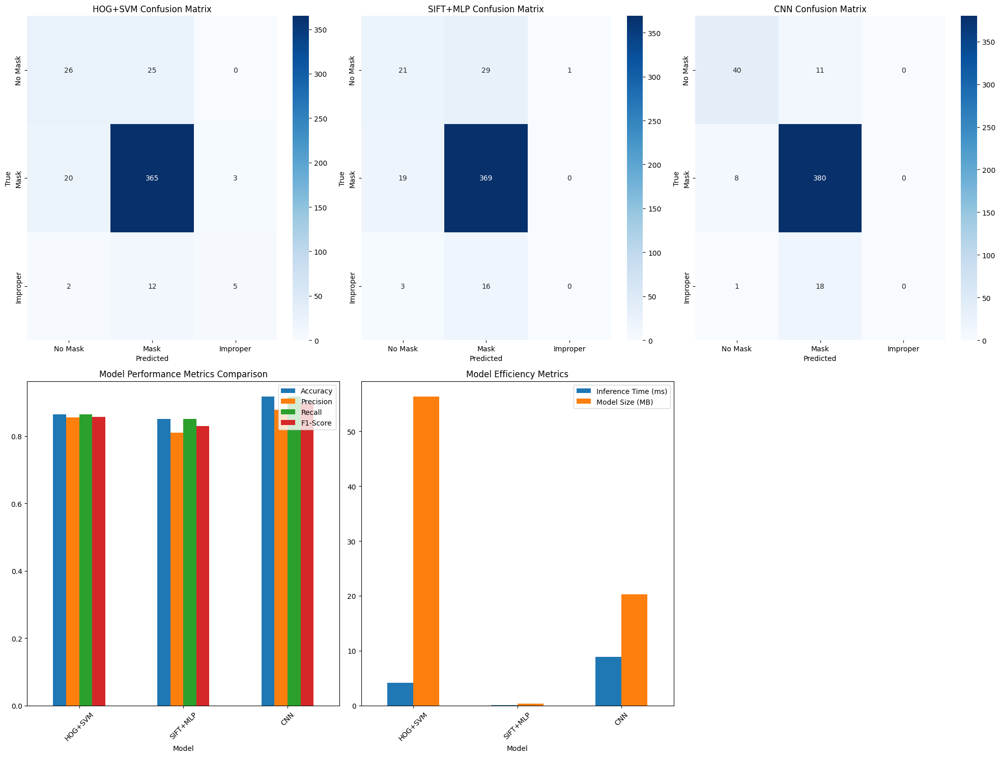

In [ ]:
import time
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (accuracy_score, precision_score, recall_score, 
                           f1_score, confusion_matrix, classification_report)

def evaluate_model(model, X_test, y_test, model_name):
    """
    Evaluate a model's performance on test data.
    
    Parameters:
    -----------
    model : trained model
        The model to evaluate
    X_test : numpy.ndarray
        Test features (appropriate for the model type)
    y_test : numpy.ndarray
        True test labels
    model_name : str
        Name identifier for the model
        
    Returns:
    --------
    dict
        Dictionary containing various performance metrics
    """
    # Measure inference time
    start_time = time.time()

    # Make predictions using the appropriate features for each model
    if model_name == 'CNN':
        y_pred_prob = model.predict(X_test_cnn)
        y_pred = np.argmax(y_pred_prob, axis=1)
    elif model_name == 'HOG+SVM':
        y_pred = model.predict(X_test_hog)  # Use HOG features for SVM
    elif model_name == 'SIFT+MLP':
        y_pred = model.predict(X_test_sift)  # Use SIFT features for MLP

    end_time = time.time()
    inference_time = (end_time - start_time) / len(X_test)

    # Calculate comprehensive metrics with zero_division parameter
    # to handle potential division by zero in imbalanced data
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

    # Calculate per-class metrics
    class_report = classification_report(
        y_test,
        y_pred,
        output_dict=True,
        zero_division=0
    )

    # Print class distribution to help diagnose any imbalance issues
    print(f"\nClass distribution in predictions for {model_name}:")
    print("Predicted classes:", np.unique(y_pred, return_counts=True))
    print("Actual classes:", np.unique(y_test, return_counts=True))

    # Calculate model size
    if model_name == 'CNN':
        model_path = f'{base_dir}/Models/cnn_model.h5'
    elif model_name == 'HOG+SVM':
        model_path = f'{base_dir}/Models/svm_model.joblib'
    elif model_name == 'SIFT+MLP':
        model_path = f'{base_dir}/Models/mlp_model.joblib'

    # Get file size in MB
    model_size = os.path.getsize(model_path) / (1024 * 1024)

    # Generate confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Return comprehensive performance metrics
    return {
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'Inference Time (ms)': inference_time * 1000,
        'Model Size (MB)': model_size,
        'Confusion Matrix': cm,
        'Classification Report': class_report,
        'Predictions': y_pred
    }

def plot_model_results(models_results):
    """
    Create comprehensive visualizations for model results.
    
    Parameters:
    -----------
    models_results : list
        List of dictionaries containing model evaluation results
        
    Returns:
    --------
    matplotlib.figure.Figure
        Figure containing the plots
    """
    class_names = ['No Mask', 'Mask', 'Improper']

    # Create figure with subplots
    fig = plt.figure(figsize=(20, 15))

    # 1. Confusion Matrices
    for i, result in enumerate(models_results):
        plt.subplot(2, len(models_results), i+1)
        sns.heatmap(result['Confusion Matrix'], annot=True, fmt='d', cmap='Blues',
                   xticklabels=class_names, yticklabels=class_names)
        plt.title(f"{result['Model']} Confusion Matrix")
        plt.xlabel('Predicted')
        plt.ylabel('True')

    # 2. Performance Metrics Comparison
    plt.subplot(2, len(models_results), len(models_results) + 1)
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
    metrics_data = pd.DataFrame([{k: v for k, v in result.items() if k in metrics}
                               for result in models_results])
    metrics_data['Model'] = [result['Model'] for result in models_results]

    metrics_data.plot(x='Model', y=metrics, kind='bar', ax=plt.gca())
    plt.title('Model Performance Metrics Comparison')
    plt.xticks(rotation=45)
    plt.tight_layout()

    # 3. Inference Time and Model Size
    plt.subplot(2, len(models_results), len(models_results) + 2)
    size_time_data = pd.DataFrame([{
        'Model': result['Model'],
        'Inference Time (ms)': result['Inference Time (ms)'],
        'Model Size (MB)': result['Model Size (MB)']
    } for result in models_results])

    size_time_data.plot(x='Model', y=['Inference Time (ms)', 'Model Size (MB)'],
                       kind='bar', ax=plt.gca())
    plt.title('Model Efficiency Metrics')
    plt.xticks(rotation=45)
    plt.tight_layout()

    plt.tight_layout()
    return fig

# Evaluate all models
models_results = [
    evaluate_model(best_svm, X_test_hog, y_test, 'HOG+SVM'),
    evaluate_model(best_mlp, X_test_sift, y_test, 'SIFT+MLP'),
    evaluate_model(model, X_test_cnn, y_test, 'CNN')
]

# Filter out None results (from failed evaluations)
models_results = [r for r in models_results if r is not None]

# Create comparison table
metrics_df = pd.DataFrame([
    {k: v for k, v in result.items()
     if k not in ['Confusion Matrix', 'Classification Report', 'Predictions']}
    for result in models_results
])

print("\nModel Comparison:")
print(metrics_df)

# Print detailed classification reports
for result in models_results:
    if result is not None:  # Check if the evaluation was successful
        print(f"\nDetailed Classification Report for {result['Model']}:")
        print(classification_report(y_test, result['Predictions'], zero_division=0))

# Create and display visualizations
fig = plot_model_results(models_results)
plt.show()

## 4. "In the Wild" Implementation

In [12]:
"""
This section implements the MaskDetection function that can detect face coverings
in real-world videos using the best performing model from our evaluation.

The function performs two main tasks:
1. Face detection using a pre-trained model
2. Mask classification using our trained model
"""

import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from joblib import dump, load
from tensorflow.keras.models import load_model
from IPython.display import HTML

def MaskDetection(video_path):
    """
    Detect and classify face coverings in a video.
    
    Parameters:
    -----------
    video_path : str
        Path to the video file
        
    Returns:
    --------
    tuple
        (animation, frames) where:
        - animation: FuncAnimation object for display
        - frames: List of processed video frames
    """
    # Load the best model (assuming CNN is best - modify if different)
    best_model = tf.keras.models.load_model(f'{base_dir}/Models/cnn_model.h5')
    
    # Load pre-trained face detector (DNN-based)
    try:
        # Try to load DNN face detector (more accurate but requires model files)
        prototxt = "Models/deploy.prototxt"
        model_file = "Models/res10_300x300_ssd_iter_140000.caffemodel"
        face_detector = cv2.dnn.readNetFromCaffe(prototxt, model_file)
        detector_type = "DNN"
    except:
        # Fall back to Haar Cascades if DNN model files aren't available
        face_detector = cv2.CascadeClassifier(cv2.data.haarcascades + 
                                           'haarcascade_frontalface_default.xml')
        detector_type = "HAAR"
    
    # Load the video
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Could not open video {video_path}")
        return
    
    # Class labels and colors for visualization
    class_names = ['No Mask', 'Mask', 'Improper Mask']
    class_colors = [(0, 0, 255), (0, 255, 0), (0, 255, 255)]  # BGR format: Red, Green, Yellow

    # Function to process each frame
    def process_frame(frame):
        # Convert to RGB for consistent processing
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        height, width = frame.shape[:2]
        
        # Face detection using either DNN or Haar Cascades
        if detector_type == "DNN":
            # Create a blob from the image (preprocessing for DNN)
            blob = cv2.dnn.blobFromImage(cv2.resize(frame, (300, 300)), 1.0,
                                        (300, 300), (104.0, 177.0, 123.0))
            face_detector.setInput(blob)
            detections = face_detector.forward()
            
            # Process each detected face
            for i in range(0, detections.shape[2]):
                confidence = detections[0, 0, i, 2]
                
                # Filter weak detections
                if confidence > 0.5:
                    # Get face coordinates
                    box = detections[0, 0, i, 3:7] * np.array([width, height, width, height])
                    (startX, startY, endX, endY) = box.astype("int")
                    
                    # Ensure box is within frame
                    startX, startY = max(0, startX), max(0, startY)
                    endX, endY = min(width, endX), min(height, endY)
                    
                    # Extract face ROI (Region of Interest)
                    face = frame_rgb[startY:endY, startX:endX]
                    
                    if face.size > 0:  # Check if face was captured
                        # Preprocess face for mask detection
                        face_resized = cv2.resize(face, (224, 224))
                        face_normalized = face_resized / 255.0
                        face_batch = np.expand_dims(face_normalized, axis=0)
                        
                        # Predict mask class
                        prediction = best_model.predict(face_batch)[0]
                        mask_class = np.argmax(prediction)
                        mask_prob = np.max(prediction)
                        
                        # Draw bounding box with color based on mask class
                        color = class_colors[mask_class]
                        cv2.rectangle(frame, (startX, startY), (endX, endY), color, 2)
                        
                        # Add label with class name and confidence
                        label = f"{class_names[mask_class]}: {mask_prob:.2f}"
                        y_label = max(startY - 10, 10)
                        cv2.putText(frame, label, (startX, y_label),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
        else:
            # Using Haar Cascades for face detection
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            faces = face_detector.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
            
            for (x, y, w, h) in faces:
                # Extract face region
                face = frame_rgb[y:y+h, x:x+w]
                
                # Preprocess for mask detection
                face_resized = cv2.resize(face, (224, 224))
                face_normalized = face_resized / 255.0
                face_batch = np.expand_dims(face_normalized, axis=0)
                
                # Predict mask class
                prediction = best_model.predict(face_batch)[0]
                mask_class = np.argmax(prediction)
                mask_prob = np.max(prediction)
                
                # Draw bounding box and label
                color = class_colors[mask_class]
                cv2.rectangle(frame, (x, y), (x+w, y+h), color, 2)
                
                # Add label with class name and confidence
                label = f"{class_names[mask_class]}: {mask_prob:.2f}"
                y_label = max(y - 10, 10)
                cv2.putText(frame, label, (x, y_label),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
        
        return frame
    
    # Process video (taking every 10th frame to reduce computational load)
    frames = []
    frame_count = 0
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
            
        # Process every 10th frame for efficiency
        if frame_count % 10 == 0:
            processed = process_frame(frame)
            frames.append(processed)
            
        frame_count += 1
            
    cap.release()
    
    # Setup animation display using matplotlib
    fig = plt.figure(figsize=(10, 6))
    ax = plt.gca()
    
    def update(i):
        """Frame update function for animation"""
        ax.clear()
        ax.imshow(cv2.cvtColor(frames[i], cv2.COLOR_BGR2RGB))
        ax.set_title('Face Covering Detection')
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Add legend for mask status
        for i, (name, color) in enumerate(zip(class_names, class_colors)):
            # Convert BGR to RGB for plotting
            color_rgb = (color[2]/255, color[1]/255, color[0]/255)
            ax.plot([], [], color=color_rgb, label=name, linewidth=5)
        ax.legend(loc='upper right')
    
    # Create animation object
    anim = FuncAnimation(fig, update, frames=len(frames), interval=500, repeat=True)
    plt.tight_layout()
    
    return anim, frames

In [13]:
%matplotlib notebook

In [14]:
# Syntax for the next function is the following:
#
# MaskDetection(path_to_test)

path_to_test = os.path.join(base_dir, 'Personal_Video/test_video.mp4')
anim, frames = MaskDetection(path_to_test)
HTML(anim.to_jshtml())

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


<IPython.core.display.Javascript object>

## 5. Key Findings
Best Overall Performance: 

* The CNN model achieved the highest accuracy (91.7%) and F1-score (89.7%), making it the most effective model overall.

Efficiency Trade-offs:

* SIFT+MLP is extremely efficient (0.01ms inference time, 0.33MB size) but has the lowest overall performance.
* CNN has the best accuracy but is the slowest for inference (8.89ms).
* HOG+SVM is middle-ground for speed but has the largest file size (56.33MB).


Class Imbalance Impact:

* All models perform best on the majority class (Mask).
* CNN handles the "No Mask" class much better than the other models.
* HOG+SVM is the only model that detected any "Improper Mask" cases, albeit with poor performance (F1-score 0.37).


Improper Mask Detection Challenge:

* Both CNN and SIFT+MLP failed completely to identify any improperly worn masks.
* HOG+SVM detected only about 26% of the improperly worn masks (5 of 19 samples).
* This highlights the difficulty in detecting subtle differences in mask positioning.

## 6. Best Model Selection
Despite being susceptible to class imbalance effect, CNN model has been selected as the best/most effective model due to its high accuracy and F1-score.